Copyright 2015-2025 Universidad Complutense de Madrid (UCM)

This file contains code adapted from Numina https://github.com/guaix-ucm/numina.

It was developed by N. Cardiel for students of the Astrophysics Master (UCM).

This is an adapted version for lectures at ULS (Chile).

* License:
SPDX-License-Identifier: GPL-3.0+

* Modified by:
C. Cabello (UCM; Spain), 
L. Costantin (CAB; Spain)

## Flat field correction

### Imports

In [1]:
'''
:Settings:
conda activate uls_2025

:History:
23 Mar 25:  version 1.0
'''

import glob
import ccdproc
import numpy as np
import teareduce as tea
import matplotlib.pyplot as plt

from pathlib import Path
from astropy.io import fits
from datetime import datetime
from tqdm.notebook import tqdm
from astropy.stats import mad_std
from astropy.nddata import CCDData
from ccdproc import ImageFileCollection

tea.avoid_astropy_warnings(True)

__version__ = "1.0"
__author__  = "Cristina Cabello (UCM, Spain) and Luca Costantin (CAB, Spain)"


### Read files

In [5]:
galaxy_ID        = 'NGC2366'
specphot_star_ID = 'HR3454'

## MODIFY THE FOLLOWING

abs_path = f'/home/diegosuzaku/NGC2366Workshop'

dir_calibration = Path(f'{abs_path}/calibration/spectroscopy')

print(dir_calibration)

/home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy


Read all frames trimmed (t_) and corrected for bias (z_). Then, sort all files by image type: arc, domeflat, science/star, science/target.

In [6]:
list_arc      = []
list_star     = []
list_target   = []
list_domeflat = []

input_files = sorted(glob.glob(f'{dir_calibration}/zt_*.fits'))

for file in input_files:

    with fits.open(file) as hdu:
        k_imagetyp = hdu[0].header['IMAGETYP']
        k_object   = hdu[0].header['OBJECT']
        k_exptime  = hdu[0].header['EXPTIME']

    if (k_imagetyp == 'arc'):

            list_arc.append(file)

    if (k_imagetyp == 'flat'):

            list_domeflat.append(file)

    if (k_imagetyp == 'science' and k_object == specphot_star_ID):

            list_star.append(file)

    if (k_imagetyp == 'science' and k_exptime == 1200.0):

            list_target.append(file)

print(f'Arc:             {len(list_arc)} files.')
print(f'Domeflat:        {len(list_domeflat)} files.')
print(f'Spec-phot star:  {len(list_star)} files.')
print(f'Target:          {len(list_target)} files.')


Arc:             3 files.
Domeflat:        16 files.
Spec-phot star:  1 files.
Target:          3 files.


In [7]:
selected_keywords = ['NAXIS1', 'NAXIS2', 'OBJECT' ,'IMAGETYP', 'EXPTIME' , 
                     'INSFLID', 'DATE-OBS', 'FILTER']

ifc_domeflat = ImageFileCollection(location=f'{dir_calibration}',
                                  filenames=list_domeflat,
                                  keywords=selected_keywords)

summary_domeflat = tea.ifc_statsummary(ifc_domeflat, dir_calibration)
summary_domeflat.show_in_notebook()


  0%|          | 0/16 [00:00<?, ?it/s]

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

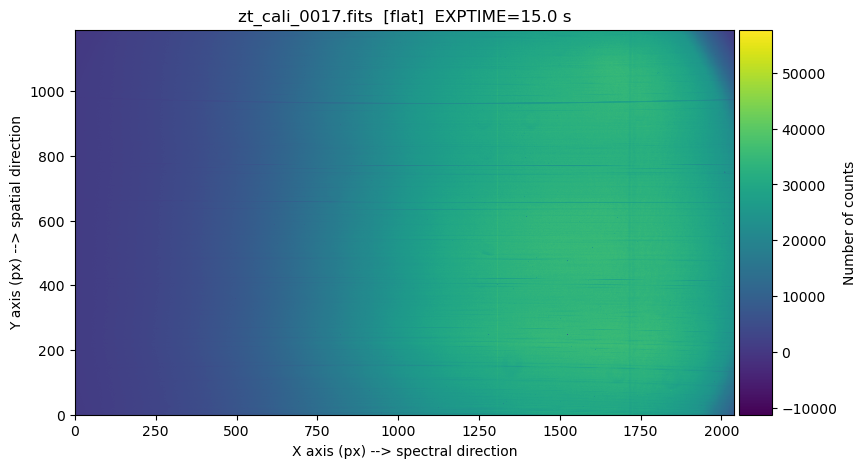

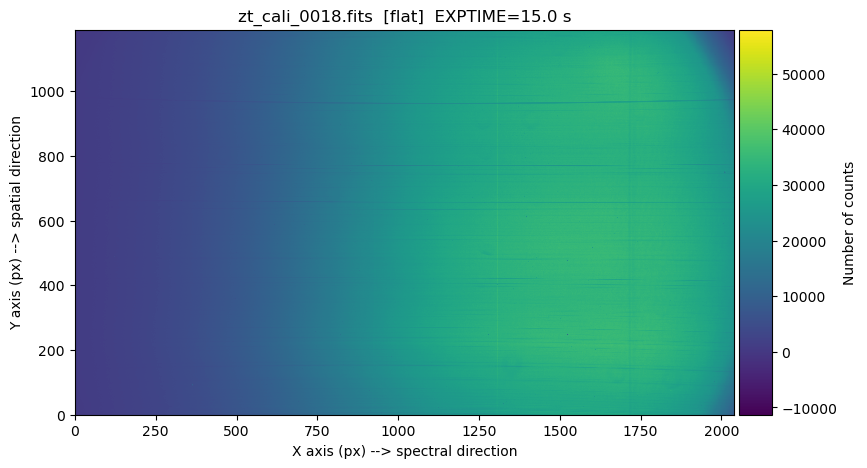

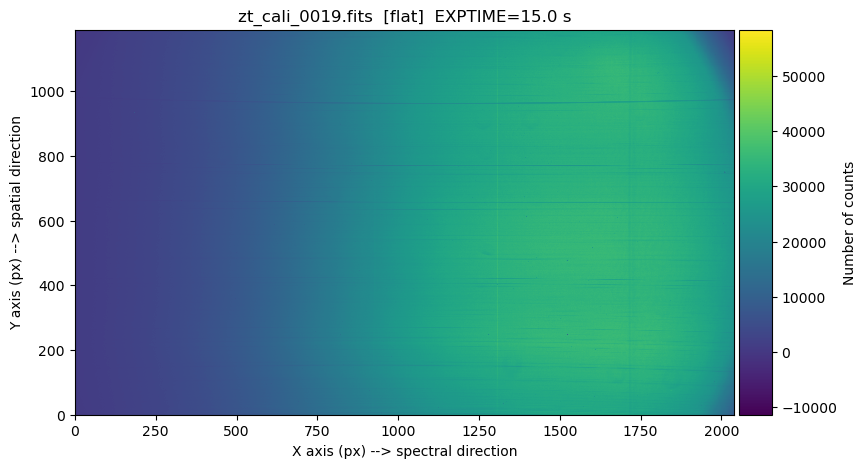

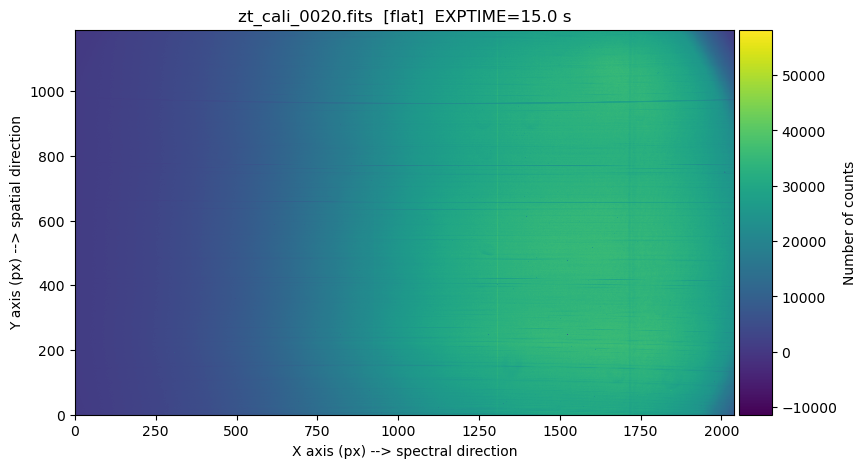

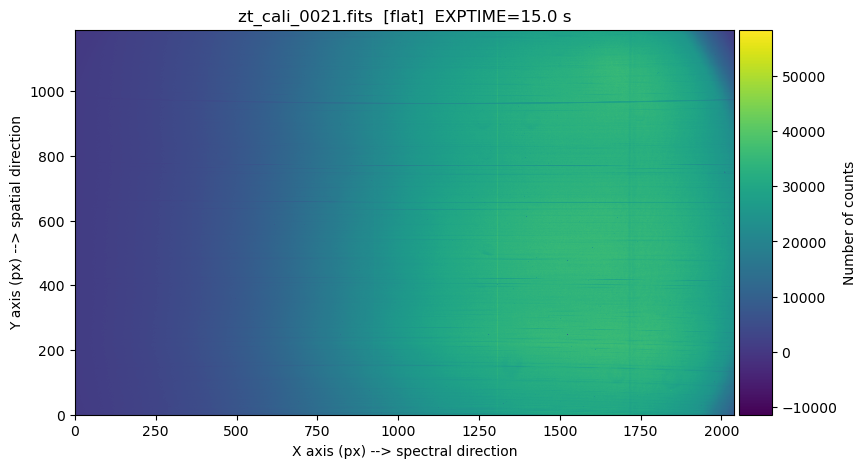

...

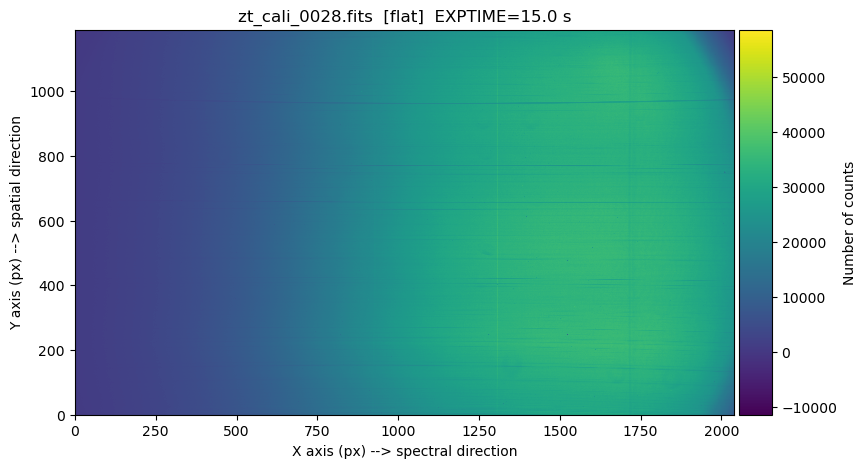

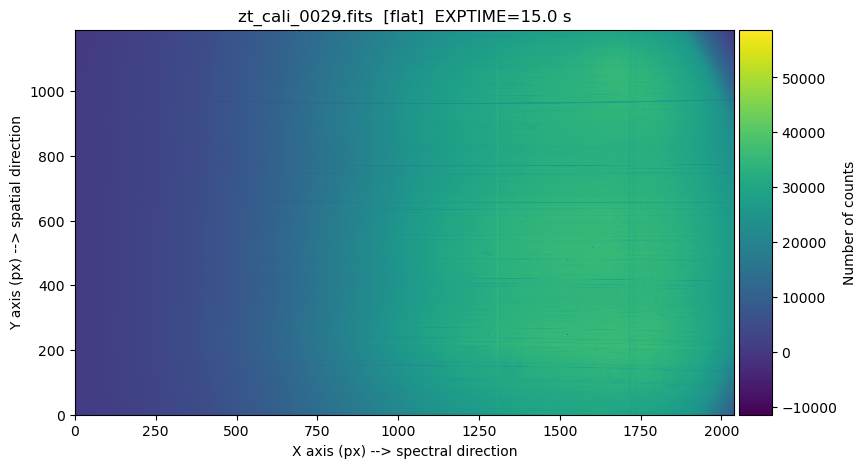

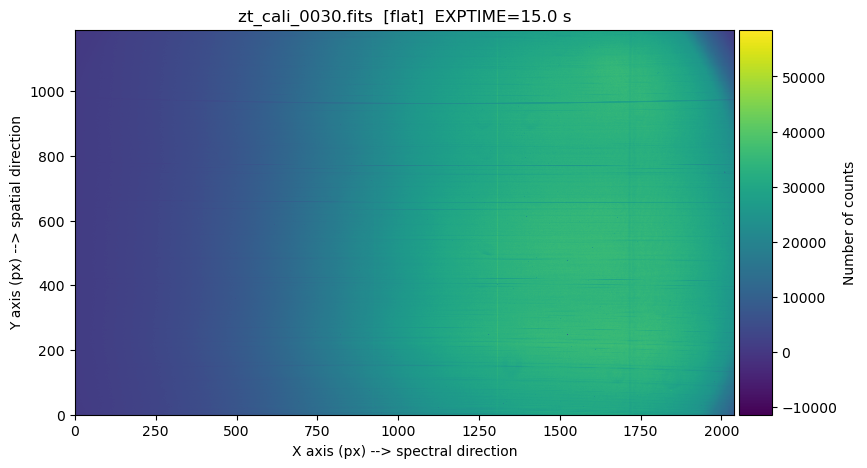

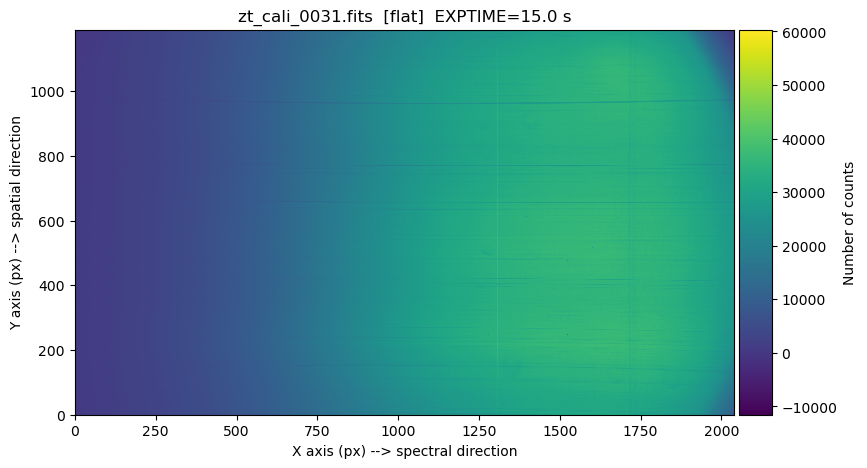

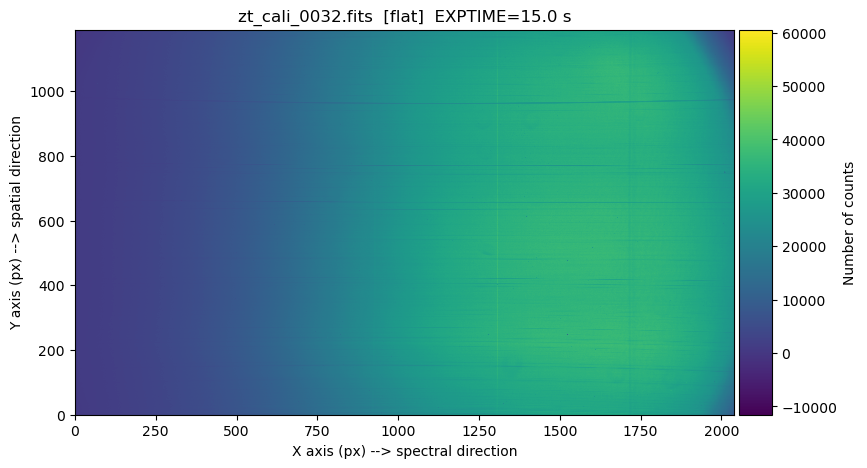

In [8]:
show_all = True

for (filename, objname, exptime, 
     median, robust_std) in summary_domeflat['file', 'OBJECT', 
                                             'EXPTIME', 'median', 
                                             'robust_std']:
     
     data = fits.getdata(dir_calibration / filename)
     vmin = median - 2 * robust_std
     vmax = median + 2 * robust_std

     if (show_all == True):
          fig, ax = plt.subplots(figsize=(15, 5))
          tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
          ax.set_title(f'{filename}  [{objname}]  EXPTIME={exptime} s')
          ax.set_xlabel('X axis (px) --> spectral direction')
          ax.set_ylabel('Y axis (px) --> spatial direction')
          plt.show()
     else:
          fig, ax = plt.subplots(figsize=(15, 5))
          tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
          ax.set_title(f'{filename}  [{objname}]  EXPTIME={exptime} s')
          ax.set_xlabel('X axis (px) --> spectral direction')
          ax.set_ylabel('Y axis (px) --> spatial direction')
          plt.show()
          break


#### Normalize exposures

In [9]:
num_flats  = len(list_domeflat)
    
## create list of CCDData instances
list_ccddata_flats = []

for i in tqdm(range(num_flats), desc=f'Normalizing individual exposures'):
    filename = list_domeflat[i]
    ccdimage = CCDData.read(filename)

## normalize image and keep header info (handle_meta)
    ccdimage = ccdimage.divide(np.median(ccdimage.data, axis=0), handle_meta='first_found')
    list_ccddata_flats.append(ccdimage)

## combine images
print(f'Combining {num_flats} images')

for ccdimage in list_ccddata_flats:
    print(f"- {ccdimage.header['FILENAME']}")

Normalizing individual exposures:   0%|          | 0/16 [00:00<?, ?it/s]

Combining 16 images
- zt_cali_0017.fits
- zt_cali_0018.fits
- zt_cali_0019.fits
- zt_cali_0020.fits
- zt_cali_0021.fits
- zt_cali_0022.fits
- zt_cali_0023.fits
- zt_cali_0024.fits
- zt_cali_0025.fits
- zt_cali_0026.fits
- zt_cali_0027.fits
- zt_cali_0028.fits
- zt_cali_0029.fits
- zt_cali_0030.fits
- zt_cali_0031.fits
- zt_cali_0032.fits


#### Create masterflat

In [10]:
master_flat = ccdproc.combine(img_list=list_ccddata_flats,
                              method='average',
                              sigma_clip=True, 
                              sigma_clip_low_thres=5, 
                              sigma_clip_high_thres=5,
                              sigma_clip_func=np.ma.median, 
                              sigma_clip_dev_func=mad_std)

## update header keywords
output_filename = f'master_domeflat.fits'
master_flat.header['FILENAME'] = output_filename
master_flat.header['HISTORY'] = '-------------------'
master_flat.header['HISTORY'] = f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}"
master_flat.header['HISTORY'] = f'master FLAT combining {num_flats} FLAT images'
master_flat.header['HISTORY'] = 'using ccdproc.combine, with average and sigma clipping'
for ccdimage in list_ccddata_flats:
    master_flat.header['HISTORY'] = f"+ {ccdimage.header['FILENAME']}"

print(f'Saving {output_filename}')

## save result
master_flat.write(dir_calibration / output_filename, overwrite='yes')


Saving master_domeflat.fits


Display combined image

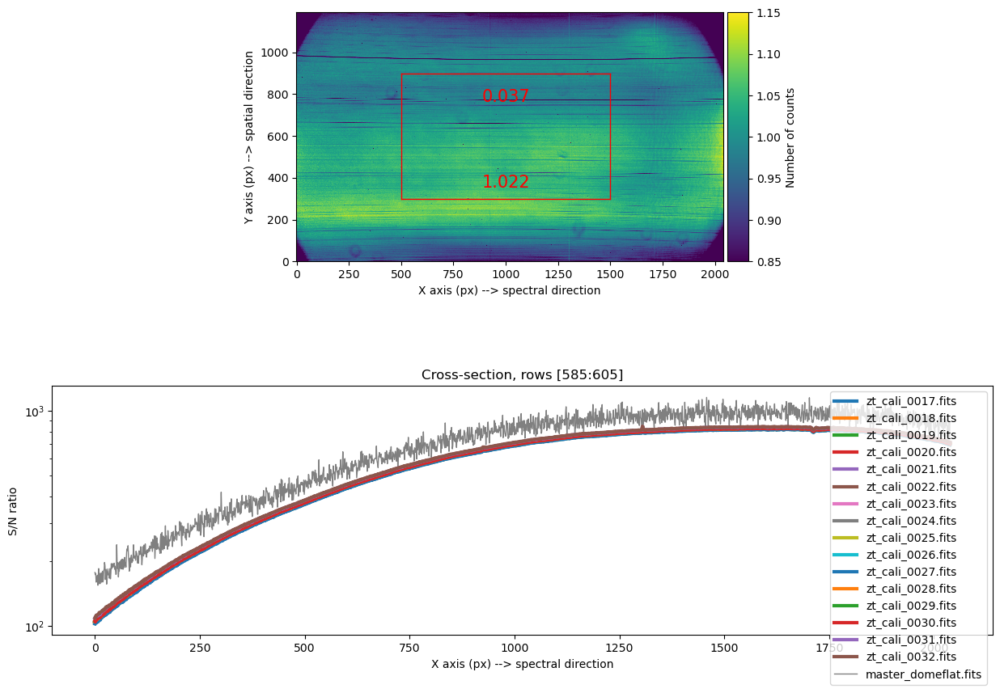

In [11]:
naxis2, naxis1 = master_flat.data.shape

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(15, 10), 
                               gridspec_kw = {'hspace':0.5})

vmin, vmax = 0.85, 1.15

tea.imshow(fig, ax1, master_flat.data, vmin=vmin, vmax=vmax)
tea.draw_rectangle(ax1, master_flat.data, 500, 1500, 300, 900, 
                   color='red', text=True, ndigits=3)

# plot S/N ratio
for ccdimage in list_ccddata_flats:

    xplot = np.arange(naxis1)
    central_row = naxis2 // 2
    row1 = central_row - 10
    row2 = central_row + 10
    sn_ratio = ccdimage.data / ccdimage.uncertainty.array
    ax2.plot(xplot, np.median(sn_ratio[row1:(row2+1), :], axis=0), 
             lw=3, label=ccdimage.header['FILENAME'], zorder=1)
    ax2.set_xlabel('X axis')
    ax2.set_ylabel('S/N ratio')
    ax2.set_title(f'Cross-section, rows [{row1}:{row2}]')
sn_ratio = master_flat.data / master_flat.uncertainty.array
ax2.plot(xplot, np.median(sn_ratio[row1:(row2+1), :], axis=0), 
         lw=1, color='grey', label=master_flat.header['FILENAME'], zorder=0)
ax2.set_yscale('log')
ax2.legend()
ax1.set_xlabel('X axis (px) --> spectral direction')
ax1.set_ylabel('Y axis (px) --> spatial direction')
ax2.set_xlabel('X axis (px) --> spectral direction')
plt.tight_layout()
plt.show()

### Correct all frames for flat field

#### Arc

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_cali_0033.fits
Output file name.: fzt_cali_0033.fits


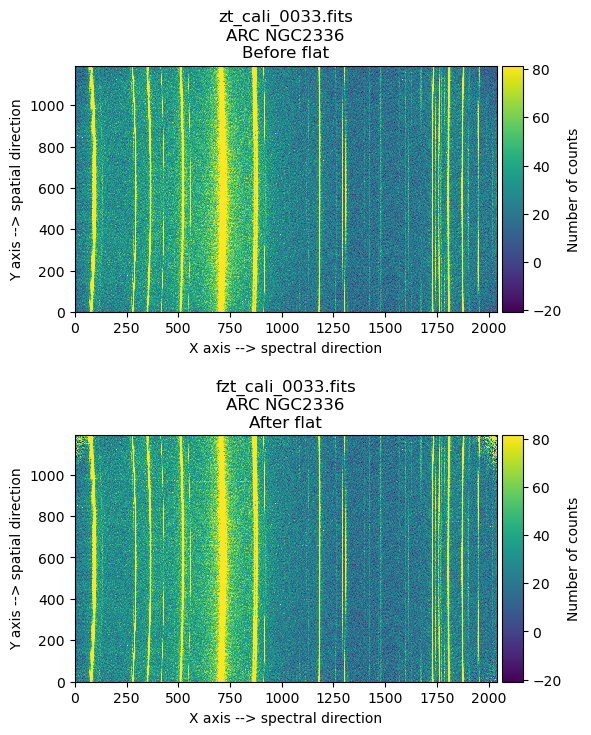

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_cali_0034.fits
Output file name.: fzt_cali_0034.fits


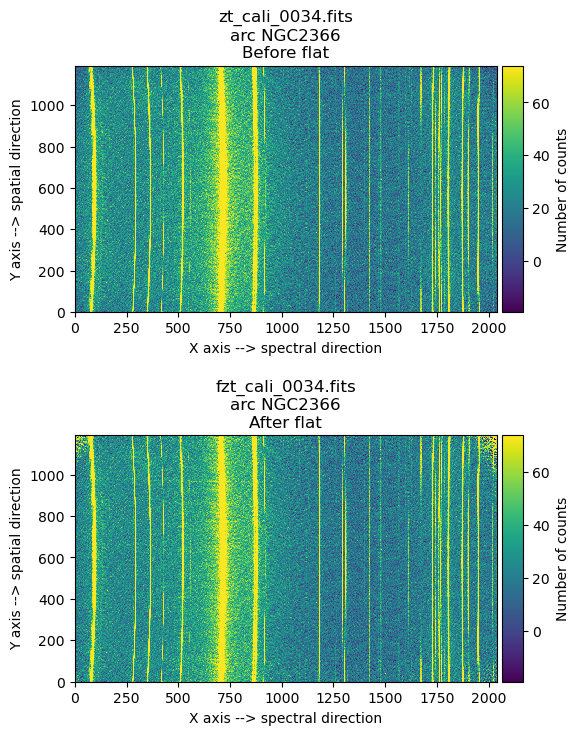

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_cali_0035.fits
Output file name.: fzt_cali_0035.fits


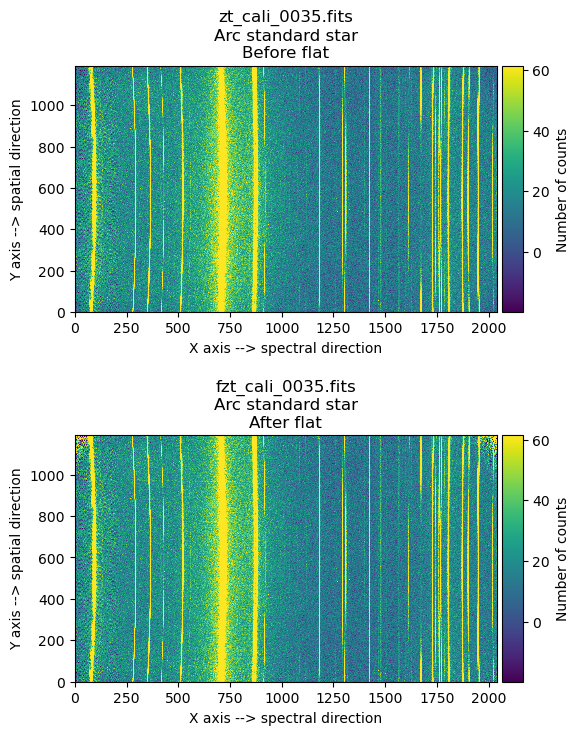

In [12]:
filename = 'master_domeflat.fits'
master_flat = CCDData.read(dir_calibration / filename)

for file in list_arc:
    print(f'Flatfielding image: {file}')    

## generate CCDData instance
    ccdimage = CCDData.read(file)

## divide science exposure by master flat
    ccdimage_after_flat = ccdproc.flat_correct(ccdimage, master_flat)
    
## update FILENAME keyword with output file name
    output_filename = f'f{file.split("/")[-1]}'
    ccdimage_after_flat.header['FILENAME'] = output_filename

## update HISTORY in header
    ccdimage_after_flat.header['HISTORY']  = '-------------------'
    ccdimage_after_flat.header['HISTORY']  = f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}"
    ccdimage_after_flat.header['HISTORY'] = 'using ccdproc.flat_correct'
    ccdimage_after_flat.header['HISTORY'] = f'master Flat Field file: {filename}'
    
## save result
    ccdimage_after_flat.write(dir_calibration / output_filename, overwrite='yes')
    print(f'Output file name.: {output_filename}')
    
## display image before and after flatfielding
    median = np.median(ccdimage_after_flat.data)
    std = tea.robust_std(ccdimage_after_flat.data)
    vmin = median - 3 * std
    vmax = median + 3 * std

    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8),
                                   gridspec_kw = {'hspace':0.5})
    
    title = f"{file.split('/')[-1]}\n{ccdimage.header['OBJECT']}\nBefore flat"
    tea.imshow(fig, ax1, ccdimage.data, vmin=vmin, vmax=vmax, title=title)
    title = f"{output_filename}\n{ccdimage.header['OBJECT']}\nAfter flat"
    tea.imshow(fig, ax2, ccdimage_after_flat.data, vmin=vmin, vmax=vmax, title=title)
    ax1.set_xlabel('X axis --> spectral direction')
    ax1.set_ylabel('Y axis --> spatial direction')
    ax2.set_xlabel('X axis --> spectral direction')
    ax2.set_ylabel('Y axis --> spatial direction')    
    plt.tight_layout()
    plt.show()

#### Spectro-photometric star

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_science_star.fits
Output file name.: fzt_science_star.fits


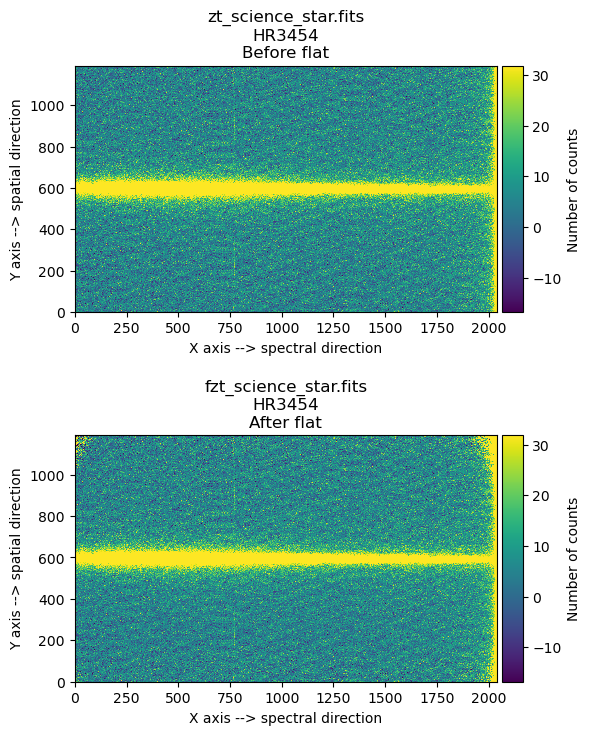

In [13]:
filename = 'master_domeflat.fits'
master_flat = CCDData.read(dir_calibration / filename)

for file in list_star:
    print(f'Flatfielding image: {file}')
    
## generate CCDData instance
    ccdimage = CCDData.read(file)

## divide science exposure by master flat
    ccdimage_after_flat = ccdproc.flat_correct(ccdimage, master_flat)
    
## update FILENAME keyword with output file name
    output_filename = f'f{file.split("/")[-1]}'
    ccdimage_after_flat.header['FILENAME'] = output_filename

## update HISTORY in header
    ccdimage_after_flat.header['HISTORY']  = '-------------------'
    ccdimage_after_flat.header['HISTORY']  = f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}"
    ccdimage_after_flat.header['HISTORY'] = 'using ccdproc.flat_correct'
    ccdimage_after_flat.header['HISTORY'] = f'master Flat Field file: {filename}'
    
## save result
    ccdimage_after_flat.write(dir_calibration / output_filename, overwrite='yes')
    print(f'Output file name.: {output_filename}')
    
## display image before and after flatfielding
    median = np.median(ccdimage_after_flat.data)
    std = tea.robust_std(ccdimage_after_flat.data)
    vmin = median - 3 * std
    vmax = median + 3 * std

    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8),
                                   gridspec_kw = {'hspace':0.5})
    
    title = f"{file.split('/')[-1]}\n{ccdimage.header['OBJECT']}\nBefore flat"
    tea.imshow(fig, ax1, ccdimage.data, vmin=vmin, vmax=vmax, title=title)
    title = f"{output_filename}\n{ccdimage.header['OBJECT']}\nAfter flat"
    tea.imshow(fig, ax2, ccdimage_after_flat.data, vmin=vmin, vmax=vmax, title=title)
    ax1.set_xlabel('X axis --> spectral direction')
    ax1.set_ylabel('Y axis --> spatial direction')
    ax2.set_xlabel('X axis --> spectral direction')
    ax2.set_ylabel('Y axis --> spatial direction')    
    plt.tight_layout()
    plt.show()

#### Target

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_science_galaxy_1.fits
Output file name.: fzt_science_galaxy_1.fits


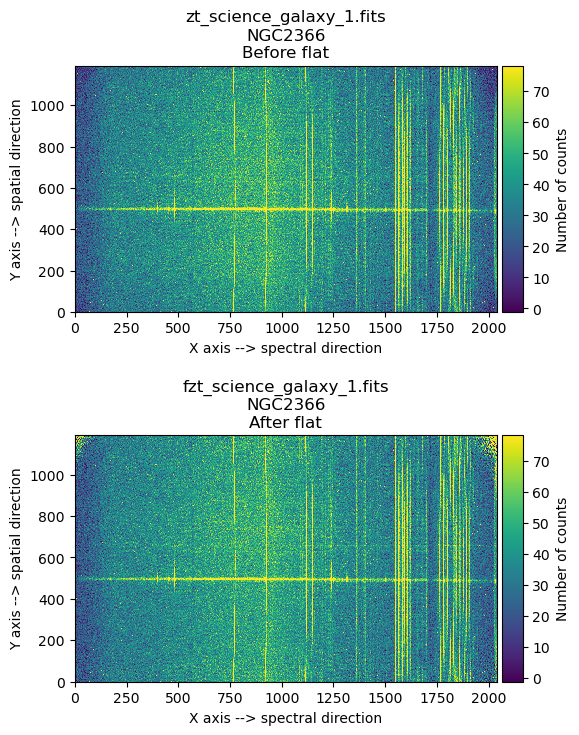

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_science_galaxy_2.fits
Output file name.: fzt_science_galaxy_2.fits


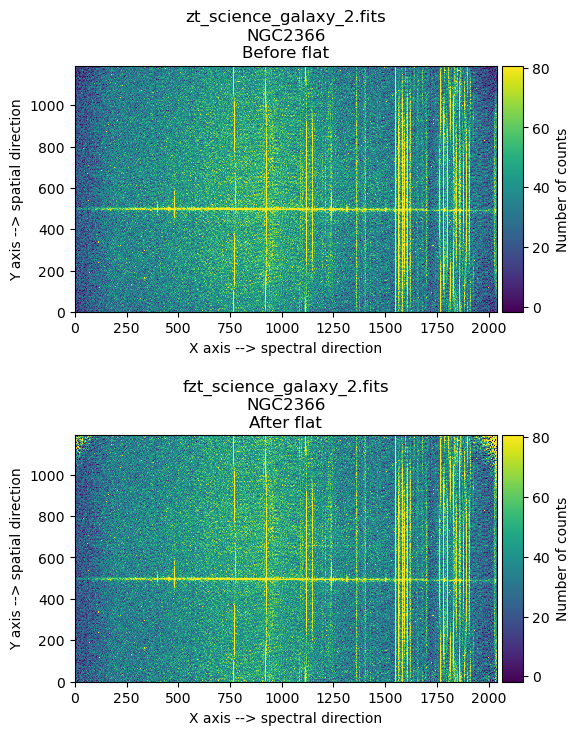

Flatfielding image: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/zt_science_galaxy_3.fits
Output file name.: fzt_science_galaxy_3.fits


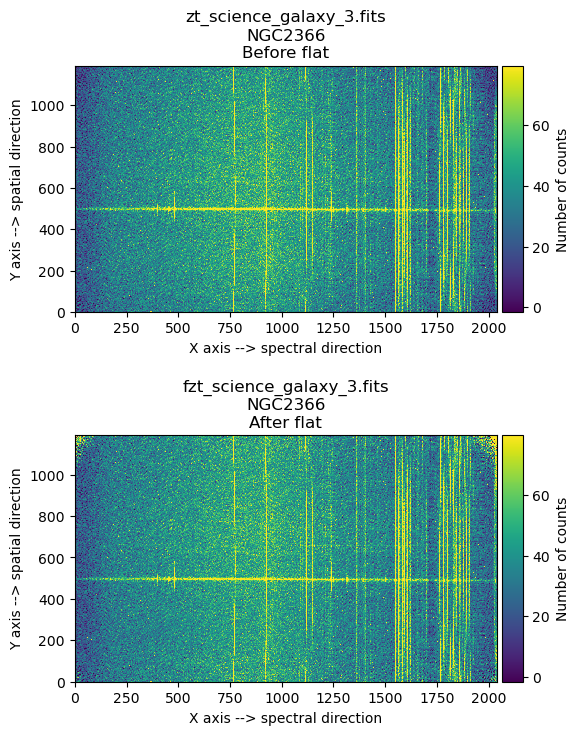

In [14]:
filename = 'master_domeflat.fits'
master_flat = CCDData.read(dir_calibration / filename)

for file in list_target:
    print(f'Flatfielding image: {file}')
    
## generate CCDData instance
    ccdimage = CCDData.read(file)

## divide science exposure by master flat
    ccdimage_after_flat = ccdproc.flat_correct(ccdimage, master_flat)
    
## update FILENAME keyword with output file name
    output_filename = f'f{file.split("/")[-1]}'
    ccdimage_after_flat.header['FILENAME'] = output_filename

## update HISTORY in header
    ccdimage_after_flat.header['HISTORY']  = '-------------------'
    ccdimage_after_flat.header['HISTORY']  = f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}"
    ccdimage_after_flat.header['HISTORY'] = 'using ccdproc.flat_correct'
    ccdimage_after_flat.header['HISTORY'] = f'master Flat Field file: {filename}'
    
## save result
    ccdimage_after_flat.write(dir_calibration / output_filename, overwrite='yes')
    print(f'Output file name.: {output_filename}')
    
## display image before and after flatfielding
    median = np.median(ccdimage_after_flat.data)
    std = tea.robust_std(ccdimage_after_flat.data)
    vmin = median - 3 * std
    vmax = median + 3 * std

    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8),
                                   gridspec_kw = {'hspace':0.5})
    
    title = f"{file.split('/')[-1]}\n{ccdimage.header['OBJECT']}\nBefore flat"
    tea.imshow(fig, ax1, ccdimage.data, vmin=vmin, vmax=vmax, title=title)
    title = f"{output_filename}\n{ccdimage.header['OBJECT']}\nAfter flat"
    tea.imshow(fig, ax2, ccdimage_after_flat.data, vmin=vmin, vmax=vmax, title=title)
    ax1.set_xlabel('X axis --> spectral direction')
    ax1.set_ylabel('Y axis --> spatial direction')
    ax2.set_xlabel('X axis --> spectral direction')
    ax2.set_ylabel('Y axis --> spatial direction')    
    plt.tight_layout()
    plt.show()